# <center>SISTEMA INTELIGENTE PARA EL DIAGNOSTICO DE RETINOPATÍA DIABÉTICA MEDIANTE IMÁGENES OCULARES EN LA CLÍNICA OFTALMOPIÑERES DE VALLEDUPAR

## FASE 1: COMPRENSIÓN DEL NEGOCIO
Es la más importante porque muestra las tareas de comprensión de los objetivos y requisitos del proyecto desde una perspectiva empresarial o institucional, con el fin de convertirlos en objetivos técnicos y en un plan de proyecto.
### Enfermedad de la retinopatía diabética
La retinopatía diabética es una complicación de la diabetes que afecta los ojos. Es causada por el daño a los vasos sanguíneos del tejido sensible a la luz que se encuentran en el fondo del ojo (retina). Al principio, la retinopatía diabética puede no tener síntomas o solo problemas leves de visión. Pero puede provocar ceguera. 

Cualquier persona con diabetes tipo 1 o tipo 2 puede desarrollar este trastorno. Cuanto más tiempo hayas tenido diabetes y menos te hayas controlado la glucosa en la sangre, mayor la probabilidad de desarrollar esta complicación en los ojos. 
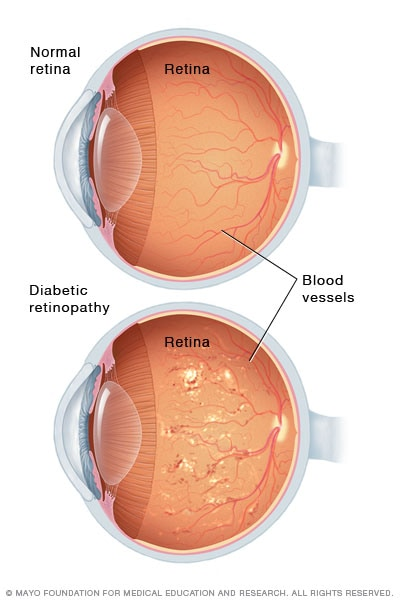

Se puede observar que la retinopatía diabética en las etapas iniciales de la retinopatía diabética, las paredes de los vasos sanguíneos en la retina se debilitan. Se desarrollan protuberancias diminutas en las paredes de los vasos y, en ocasiones, producen pérdidas o supuraciones de líquido y sangre que se introducen en la retina. Los tejidos de la retina pueden hincharse y producir manchas blancas en la retina. A medida que la retinopatía diabética avanza, puede que crezcan nuevos vasos sanguíneos y que pongan en riesgo tu visión.

### Origen de datos y almacenes de conocimientos
Los datos usados para la realización de este proyecto se obtuvieron de Kaggle URL:https://www.kaggle.com/c/aptos2019-blindness-detection/overview/description, estos contienen imágenes oculares en pacientes con  y sin retinopatía diabética. Los datos son imágenes con extensión .png, divididas en dos carpetas, test y train respectivamente. Cada carpeta posee imágenes desde pacientes sin retinopatía diabética, hasta pacientes con el nivel más avanzado. En todas las imágenes de cada carpeta se tiene un total de 5590 imágenes para trabajar el proyecto, es decir, se tiene la suficiente data para desarrollar un buen modelo.

Para más información de la primera fase, puede consultar el documento completo del desarrollo de trabajo de grado.

## FASE 2: COMPRENSIÓN DE LOS DATOS

El desarrollo de la segunda fase de la metodología CRISP – DM va enfocado a la búsqueda de información a través de los datos, para introducirnos un poco más al problema real en sí, desde los datos presentados y los informes estadísticos que podamos obtener de este, a su vez, nos va a permitir conocer la veracidad de los datos y la calidad que estos posean.

### Datos existentes
El conjunto de datos son imágenes oculares realizadas a diferentes pacientes que poseen la enfermedad de diabetes, en formato .png las cuales fueron descargadas del repositorio de Kaggle, a continuación se presenta una de esas tantas imágenes que pertenecen al conjunto de datos.

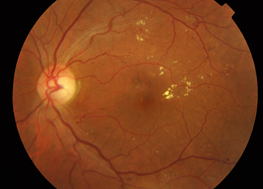

### Cantidad de datos y caracteristícas de los atributos
El data set consta de 5590 imágenes en formato .png, para observar todo la distribución de estos, es necesario requerir al uso de liberías de datos, para dar inicio al análisis exploratorio.

**A continuación se importan las librerías necesarias para el desarrollo del proyecto**

In [1]:
import os

In [2]:
os.getcwd()

'c:\\Users\\Bmez\\Documents\\Curso 0 a master python\\Proyecto de Grado'

In [1]:
BASE_PATH ='C:/Use'
TRAIN_PATH = BASE_PATH + "train/"
TEST_PATH = BASE_PATH + "test/"
PREPROC_PATH = BASE_PATH + "preprocesados/"

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import keras
import cv2
import os
from sklearn.utils import class_weight, shuffle
from sklearn.metrics import f1_score, fbeta_score
import torch

from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.applications.resnet50 import preprocess_input
import keras.backend as K
import tensorflow as tf
from tensorflow.keras.utils import Sequence
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Activation, BatchNormalization, Input,  GlobalAveragePooling2D
from tensorflow.keras.layers import GaussianNoise, GaussianDropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.constraints import maxnorm
from tensorflow.keras import regularizers, optimizers
from keras import optimizers, applications
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import cohen_kappa_score


import PIL
from PIL import Image, ImageOps
import skimage.io
from skimage.transform import resize
from imgaug import augmenters as iaa

WORKERS = 2
CHANNEL = 3

import warnings
warnings.filterwarnings("ignore")
IMG_SIZE = 512
NUM_CLASSES = 5
SEED = 77
TRAIN_NUM = 1000

%matplotlib inline

plt.style.use('ggplot')

ModuleNotFoundError: No module named 'keras'

Para empezar a desarrollar el preprocesamiento de estos datos, es importante resaltar el hecho de que existen dos archivos csv, que contienen en su interior el código de cada una de las imagenes y el tipo de diagnostico según la retinopatía, esto con el fin de observar la distribución de la clase.

**Leemos todos los conjuntos de datos**

In [2]:
dataTrain = pd.read_csv(BASE_PATH + "train.csv")
dataTest  = pd.read_csv(BASE_PATH + "test.csv")

Una vez leídos los datos procedemos a observar la información que se nos brinda.

In [3]:
dataTrain.head()

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


In [4]:
#Información de los datos de entrenamiento
dataTrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3662 entries, 0 to 3661
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id_code    3662 non-null   object
 1   diagnosis  3662 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 57.3+ KB


En la tabla anterior se puede observar, dos columnas en donde se presentan el código de la imagen (id_code) y el tipo de diagnostico representado en número, por lo que es importante resaltar lo siguiente:

**Distribución en la escala del 0 al 4 de la enfermedad**

| NIVEL DE LA ENFERMEDAD | NÚMERO DE REPRESENTACIÓN |
| :-------------: | :-------------: |
| No DR (Sin retinopatía diabetica) | 0 |
| Mild | 1 |
| Moderate | 2 |
| Severe | 3 |
| Proliferative DR | 4 |

In [5]:
#Información de los datos de prueba
dataTest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1928 entries, 0 to 1927
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id_code  1928 non-null   object
dtypes: object(1)
memory usage: 15.2+ KB


Resumiendo en una tabla la información de ambos dataset, se obtiene lo siguiente:

| FOLDER | CANTIDAD DE DATOS |
| :-------------: | :-------------: |
| TRAIN | 3662 |
| TEST | 1928 |
| **TOTAL** | **5590** |


Procedemos a observar la cantidad de datos presentes para el entrenamiento de acuerdo al nivel de la enfermedad

In [6]:
# Realizamos la categorización de nuestra variable clase
encoding = {0 : "No DR", 1 : "Mild", 2 : "Moderate", 3 :"Severe", 4 : "Proliferative DR"}
dataTrain.diagnosis = dataTrain.diagnosis.map(encoding)

# Distribución de los datos
dataTrain.diagnosis.value_counts()

No DR               1805
Moderate             999
Mild                 370
Proliferative DR     295
Severe               193
Name: diagnosis, dtype: int64

### Distribución de la variable clase
Un paso fundamental a la hora de desarrollar un modelo de clasificación, es poder determinar la variable clase y saber si ésta se encuentra balanceada, es decir, la cantidad de datos de las clases son los mismos. En este caso, la cantidad de imágenes de pacientes que fueron diagnosticados con retinopatía diabética y el nivel al que pertenece debe ser la misma para cada uno de los niveles, ya que, de no ser así, la precisión del modelo clasificando las imágenes podría verse afectada en gran medida y favorecer a cierta clase en específico, debido a que entre más datos se tengan, mejor serpa la precisión del modelo.

In [7]:
# Número de clases
N_CLASSES = dataTrain['diagnosis'].nunique()
print(f"Número de clases disponibles: {N_CLASSES}")

Número de clases disponibles: 5


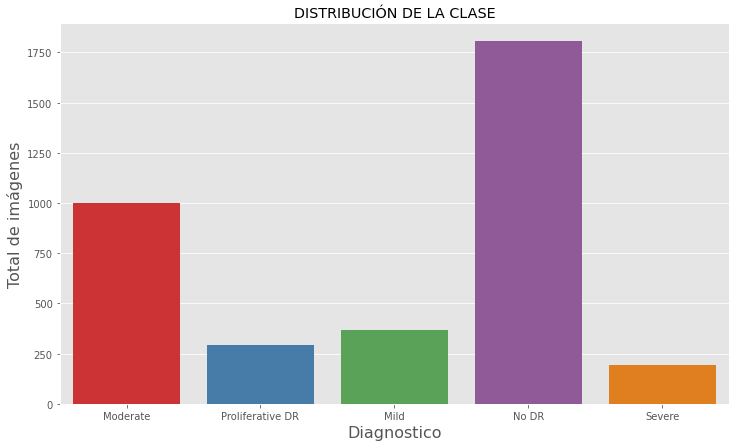

In [8]:
# Distribución de la clase
plt.figure(figsize = (12, 7))
sns.countplot(data = dataTrain, x = 'diagnosis', palette = 'Set1')
plt.title("DISTRIBUCIÓN DE LA CLASE")
plt.xlabel("Diagnostico", size = 16,)
plt.ylabel("Total de imágenes", size = 16)
plt.show()

Como se puede observar en la gráfica anterior, la variable clase no se encuentra balanceada, por lo tanto, será necesario realizar un pre – procesamiento a esta data para así poder balancearla y presentársela al modelo.


### ¿Cuál es el peso por cada clase?

Como se pudo observar que los datos están desbalanceados, se puede realizar el cálculo para cada clase, que se pueden usar para calcular la perdida de los datos.


In [9]:
# Calculamos el peso de cada clase
classWeights = class_weight.compute_class_weight( class_weight = 'balanced',
                                                  classes      = np.array( [ "No DR", "Mild", "Moderate", "Severe", "Proliferative DR"] ),
                                                  y = dataTrain['diagnosis'].values)

classWeights = torch.tensor(classWeights, dtype = torch.float)
 
print(classWeights)


tensor([0.4058, 1.9795, 0.7331, 3.7948, 2.4827])


Con los datos obtenidos en los pesos de las clases, se puede observar cual es la perdida de los datos para cada diagnóstico. Es importante observar que dichos valores no son iguales por lo que nos confirma el desbalanceo de los datos.

| DIAGNOSIS | PESO |
| :-------------: | :-------------: |
| No DR | 0.4058 |
| Mild | 1.9795 |
| Moderate | 0.7331 |
| Severe | 3.7948 |
| Proliferative DR | 2.4827 |

Realizando un análisis a los pesos es importante destacar que entre más pacientes halla por diagnostico menor será su peso para el modelo.

### ¿Todas las imágenes poseen el mismo tamaño?

Luego de observar el conjunto de datos, se pudo ver a simple vista que dichas imágenes poseen mucho ruido en su tamaño, es por eso que será necesario realizar un pre-procesamiento para todas ellas. A continuación se presentan dos imágenes para observar una respuesta más clara a la pregunta planteada.

Text(0.5, 1.0, 'Image 2')

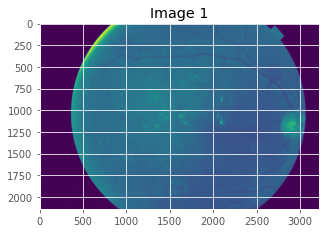

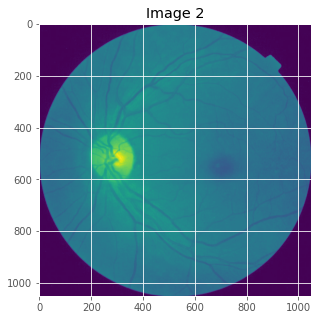

In [10]:
# Obtenemos dos imagenes de forma manual de nuestro conjunto de datos
path1 = TRAIN_PATH + "000c1434d8d7.png"
path2 = TRAIN_PATH + "00cc2b75cddd.png"

# Declaramos un vector en donde almacenaremos ambas imágenes para poder graficarlas
data = []

# Utilizamos la librería de Open CV para la lectura de las imágenes
image1 = cv2.imread(path1, 0)
image2 = cv2.imread(path2, 0)

# Añadimos ambas imágenes al arreglo
data.append(image1)
data.append(image2)

# Almacenamos en una variable de np.array
train = np.array(data, dtype="object")

# Gráficamos la primera imagen
plt.figure(figsize = (5,5))
plt.imshow(train[0])
plt.title("Image 1")

# Gráficamos la segunda imagen
plt.figure(figsize = (5,5))
plt.imshow(train[1])
plt.title("Image 2")

In [11]:
image1.shape, image2.shape

((2136, 3216), (1050, 1050))

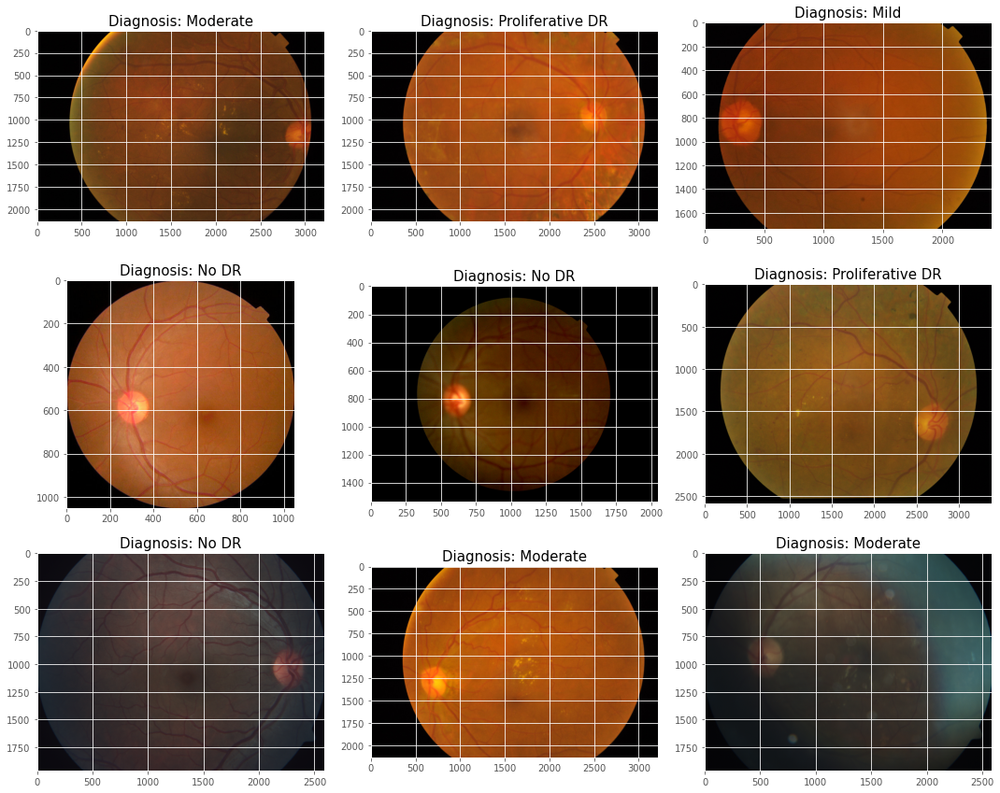

In [12]:
# Realizamos una función para observar el tamaños de las imágenes
def displaySamples(df, columns=3, rows=3):
    
    fig=plt.figure(figsize=(5*columns, 4*rows))

    for i in range(columns*rows):
        
        image_path = df.loc[i,'id_code']
        
        image_id = df.loc[i,'diagnosis']
        
        img = cv2.imread(TRAIN_PATH + f'{image_path}.png')
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        fig.add_subplot(rows, columns, i+1)
        plt.title(f"Diagnosis: {image_id}", fontsize=15)
        plt.imshow(img)
    
    plt.tight_layout()

displaySamples(dataTrain)

Cómo se puede observar en las figuras anteriores, las imágenes tienen diferente dimensión en tamaño, es decir, diferente cantidad de pixeles, lo cual hace necesario implementar una función de transformación que permita reestructurar el tamaño de cada una de las imágenes que van a participar en el desarrollo y prueba del modelo para obtener mejores resultados.

Cabe resaltar que las imágenes están en escala de grises al momento de su lectura con la librería de Open CV, pero se muestran como si estuvieran en canales RGV, azul y verde, ya que se utilizó la última versión de Python y está, representa las imágenes de escala de grises en un estilo tipo negativo.

Es importante aclarar, que pese a que las imágenes de nuestro conjunto de datos se encuentran a color, al momento de su lectura se harán en una escala de grises, esto nos brinda mayor aprovechamiento de la información. Por otro lado, si nos damos cuenta, al visualizar la dimensión de cada una de las imágenes podemos apreciar la ausencia del número 3, lo que significa que estas imágenes al momento de ser leídas cumplen con las condiciones para el desarrollo del modelo y no será necesario hacerle una transformación mayor para el aprovechamiento de las mismas, dándonos la posibilidad de tener un mejor procesamiento y mejor precisión del modelo.

## FASE 3: PREPARACIÓN DE LOS DATOS

En esta fase y una vez efectuada la recolección inicial de datos, se procede a su preparación para adaptarlos a las técnicas de Data Mining que se utilicen posteriormente, tales como técnicas de visualización de datos, búsqueda de relaciones entre variables u otras medidas para exploración de los datos. La preparación de estos incluye las tareas generales de selección de datos, limpieza, generación de variables adicionales, integración de diferentes orígenes de datos y cambios de formato.

### Selección de los datos

Nuestra data ya se encuentra previamente dividida en datos de entrenamiento pertenecientes a un (65%), y los datos de prueba a un (35%), por lo tanto no será necesario realizar una separación de ellos para llevar a cabo el modelo.
De igual forma realizando un análisis, al tratarse de imágenes y que todas pertenecen y son resultados de exámenes realizados a pacientes con retinopatía diabética, se llega a la conclusión no se realizará la eliminación de ninguna de ellas.

Es importante anotar que la división viene dada en distintos folder, sin embargo, para el entrenamiento siempre es necesario dividir los datos, en este caso dichos datos de entrenamientos serán dividos para que a medida que se vaya construyendo el modelo se vayan realizando las pruebas instántaneamente para mejoración del mismo.

A continuación se presenta un histograma de como se distribuyen dichos datos, 15% de prueba y el otro 85% como entrenamiento del 65% que conforman los datos de entrenamiento en general.

(3112,) (3112,) (550,) (550,)


<AxesSubplot:>

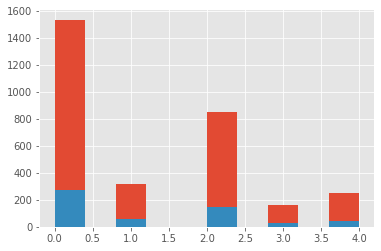

In [13]:
df_train = pd.read_csv(BASE_PATH + "train.csv")

x = df_train['id_code']
y = df_train['diagnosis']

x, y = shuffle(x, y, random_state=SEED)

train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15, stratify=y, random_state=SEED)

print(train_x.shape, train_y.shape, valid_x.shape, valid_y.shape)

train_y.hist()
valid_y.hist()

### Limpieza y transformación
Primero, se puede observar las entradas originales, cada fila de la figura 16, representa un nivel de gravedad de la enfermedad, desde el nivel 0 hasta el 5.
Lo que se busca con la muestra de los datos originales es observar como en el transcurso del pro procesamiento las imágenes van sufriendo transformaciones que van a contribuir al modelo.

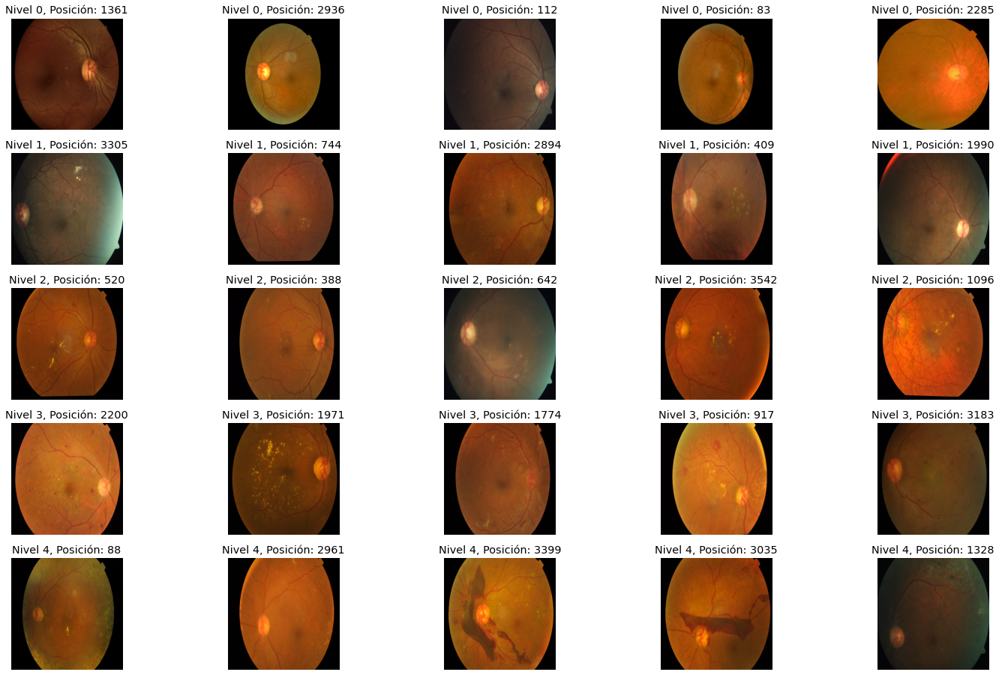

In [14]:
fig = plt.figure(figsize=(25, 16))

# Se presentan 5 imágenes por cada clase

for class_id in sorted(train_y.unique()):
    for i, (posicion, registro) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state = SEED).iterrows()):
        
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks = [], yticks = [])
        
        path = f"{TRAIN_PATH}{registro['id_code']}.png"
        
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image)
        ax.set_title('Nivel %d, Posición: %d' % (class_id, posicion) )

Analizando la imagen anterior, algunas imágenes son muy oscuras (nivel 0 con posición 112 – nivel 4 con posición 3035), y a veces la iluminación de un color es confusa (nivel 3 con posición 1774). De igual forma observando lo anterior, podemos obtener las áreas oscuras no informativas para algunas imágenes (nivel 0 con posición 2936 – nivel 0 con posición 83). Esto es importante cuando reducimos el tamaño de la imagen, ya que las áreas informativas se vuelven demasiado pequeñas. Por lo tanto, es intuitivo recortar las áreas no informativas en imágenes como las mencionadas anteriormente.

**Transformando a escala de grises**

Después de observar las imágenes a colores, se procede a probar la escala de grises para entender mejor algunas imágenes, ya que permite que la distracción del color se vaya. Un ejemplo, en la figura 17, se puede ver la sangre de forma más clara en la parte superior de la imagen (nivel 4 con posición 1328).


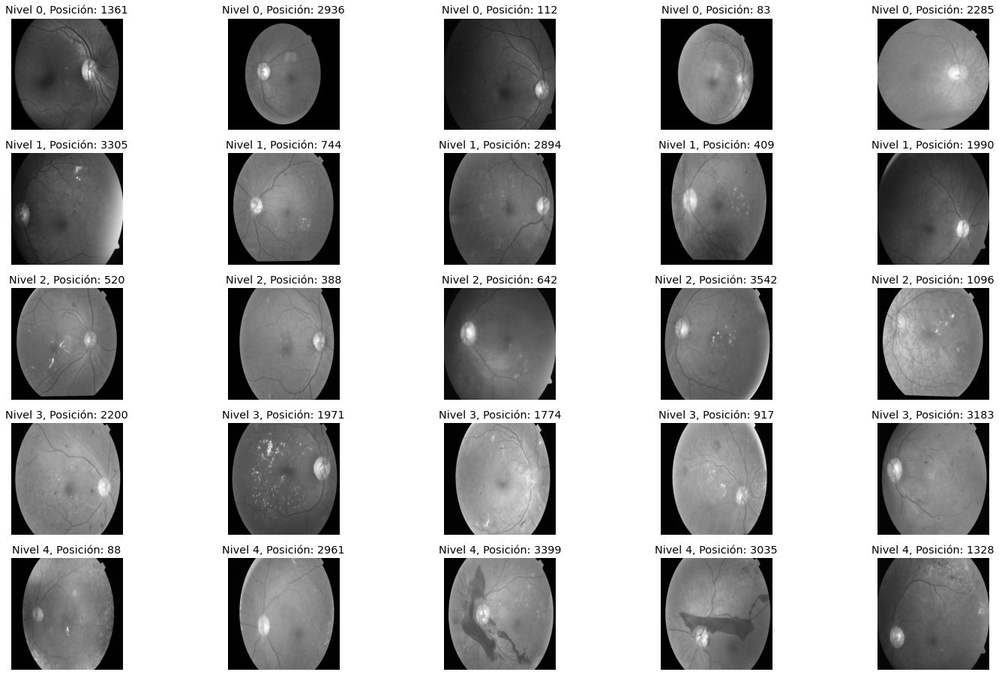

In [15]:
fig = plt.figure(figsize=(25, 16))

for class_id in sorted(train_y.unique()):
    for i, (posicion, registro) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        
        path=f"{TRAIN_PATH}{registro['id_code']}.png"
        
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image, cmap='gray')
        ax.set_title('Nivel %d, Posición: %d' % (class_id, posicion))

Ahora bien, para el nivel de gravedad 4, se puede observar que hay dos ejemplos que son difíciles de detectar, la imagen (nivel 4 con posición 2961) y la imagen (nivel 4 con posición 1328). A medida que se intenta hacer zoom para ver los detalles (usar una imagen de tamaño real, figura 18), se pueden observar algunas anomalías (manchas algodonosas o exudados duros), en esos ojos con mayor claridad (observe la parte inferior derecha del ojo). Por lo tanto, el tamaño de la imagen (IMG_SIZE) es definitivamente importante para este problema.

1958 2588


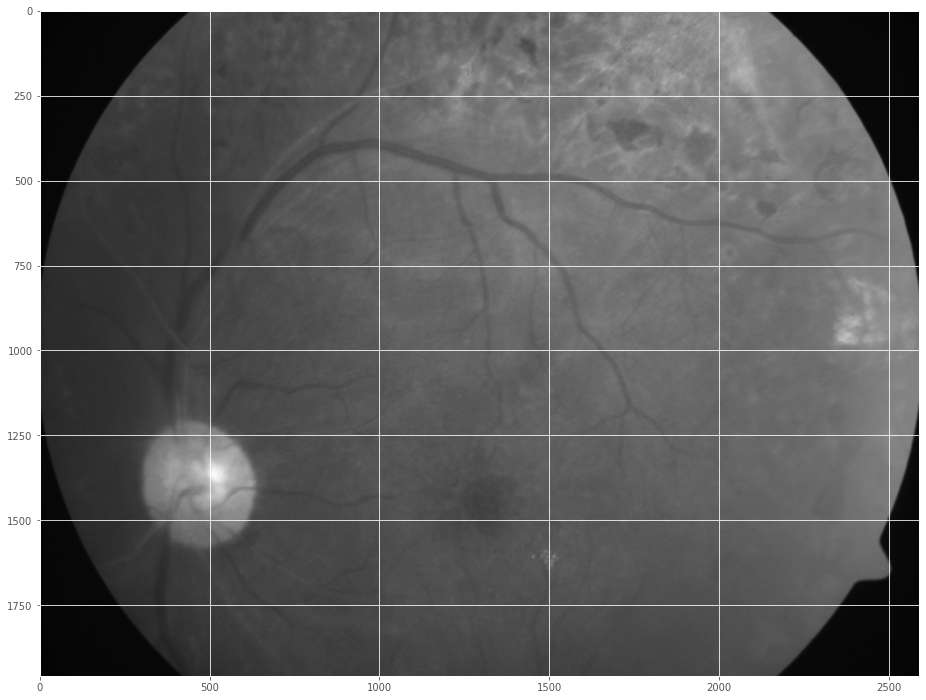

In [16]:
dpi = 80 #Pulgadas

path = f"{TRAIN_PATH}5c7ab966a3ee.png"

image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
height, width = image.shape
print(height, width)

SCALE=2
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')

**Observamos el tamaño de las imágenes**

Si bien, como se mencionó en la fase anterior, luego de realizar el análisis exploratorio y determinar que los datos poseen diferencias en cuanto a su dimensión, se procede a realizar una transformación de cada una de las imágenes, asignándoles un tamaño de 512 * 512, es decir 512 pixeles de altura y 512 pixeles de anchura. Ese tamaño fue utilizado al principio de las lecturas presenten en las imágenes anteriores, gracias a la variable IMG_SIZE, por lo que ahora solo observaremos dos imágenes del mismo dataset.

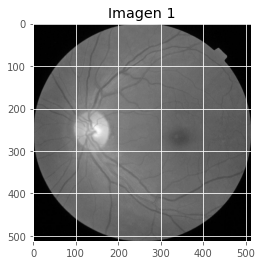

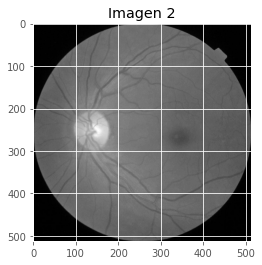

In [17]:
# Observamos las imágenes redimensionadas en el data set
# Imagen 1
path1 = f"{TRAIN_PATH}cd54d022e37d.png"
        
image1 = cv2.imread(path2)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
image1 = cv2.resize(image1, (IMG_SIZE, IMG_SIZE))

plt.imshow(image1, cmap='gray')
plt.title("Imagen 1")
plt.show()

# Imagen 2
path2 = f"{TRAIN_PATH}00cc2b75cddd.png"
        
image2 = cv2.imread(path2)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
image2 = cv2.resize(image2, (IMG_SIZE, IMG_SIZE))

plt.imshow(image2, cmap='gray')
plt.title("Imagen 2")
plt.show()

**Probando otros métodos para la transformación de los datos**

Si bien la transformación a escala de grises como se mencionó anteriormente favorece al resultado del modelo, pero hay otras técnicas, especialmente para este tipo de imágenes que facilitan la comprensión. 
Actualmente para este tipo de proyectos se utiliza mucho el método de Graham, el cual busca compartir una forma perspicaz de mejorar las condiciones de iluminación a las imágenes del dataset. Aquí podemos aplicar su idea y observar muchos detalles importantes en el ojo de mejor manera.


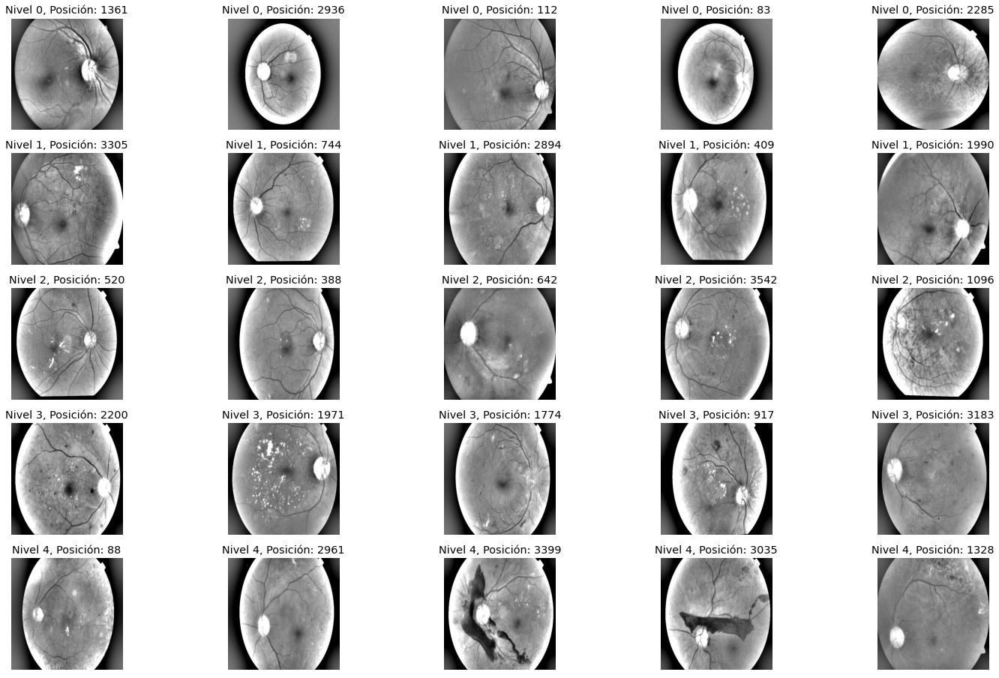

In [18]:
fig = plt.figure(figsize=(25, 16))

for class_id in sorted(train_y.unique()):
    
    for i, (posicion, registro) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        
        path=f"{TRAIN_PATH}{registro['id_code']}.png"
        
        image = cv2.imread(path)
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image = cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # El truco es agregar esta linea

        plt.imshow(image, cmap='gray')
        ax.set_title('Nivel %d, Posición: %d' % (class_id, posicion) )

**Recorte automático de las imágenes**

En esta parte de las transformación se definirán algunas funciones a nivel de código que van a permitir brindar una transformación mucho más grande a las imágenes, porque en ella se buscara reducir la información que realiza ruido dentro de estás.


In [19]:
# Funcion para recortar imágenes normales
def crop_image1(img, tol=7):
    # img son los datos de las imágenes
    # tol es la tolerancia
    mask = img > tol
    return img[np.ix_(mask.any(1),mask.any(0))]

# Función para recortar imágenes en escala de gris
def crop_image_from_gray(img,tol=7):
    # Si poseen dos canales de colores
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    # Si poseen tres canales (Son a colores)
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # La maga es demasiado oscura para que podamos recortar todo,
            return img # Retorna la imagen original
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
    #         print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
    #         print(img.shape)
        return img

In [20]:
# Función pra aplicar el método de Graham después de recortar las imágenes
def load_ben_color(path, sigmaX=10):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)
        
    return image

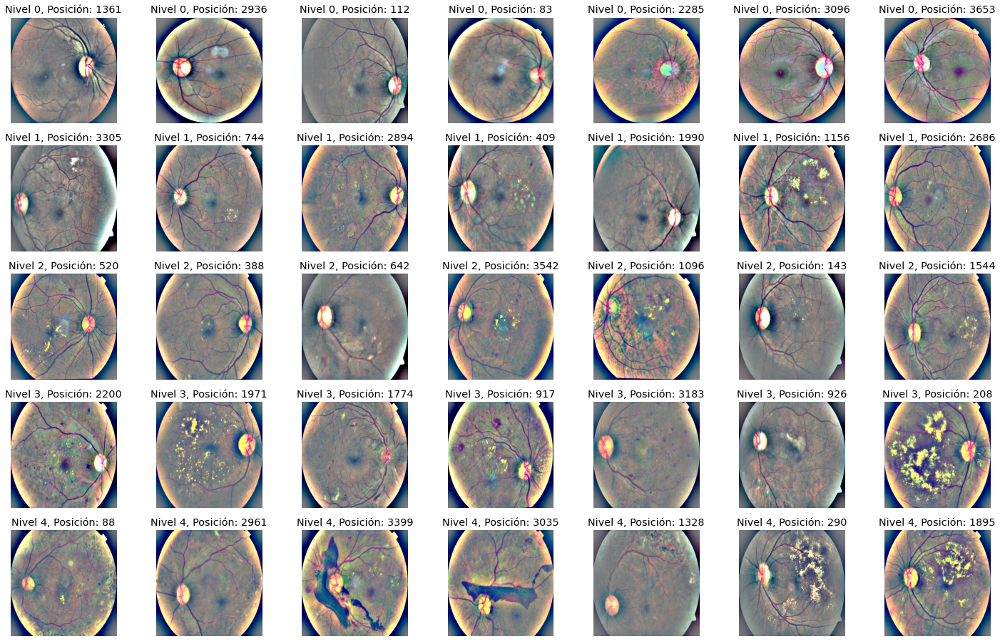

In [21]:
NUM_SAMP=7

fig = plt.figure(figsize=(25, 16))

for class_id in sorted(train_y.unique()):
    for i, (posicion, registro) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(NUM_SAMP, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        
        path=f"{TRAIN_PATH}{registro['id_code']}.png"
        image = load_ben_color(path,sigmaX=30)

        plt.imshow(image)
        ax.set_title('Nivel %d, Posición: %d' % (class_id, posicion) )

**Redondear las imágenes de la retina a un mismo tamaño**

En general, en el conjunto de datos hay 4 “tipos” de diferentes formas de imágenes en el conjunto de datos:

* **Spaceboy:** Imagen rectangular, sin recortar.
* **Cropboy:** Recorte vertical rectangular con pérdida.
* **Squareboy:** Imagen cuadrada, recorte ajustado.
* **Supercropboy:** Recorte vertical y horizontal rectangular con pérdidas.

A continuación, se muestran algunos ejemplos de estas imágenes.

(-0.5, 639.5, 479.5, -0.5)

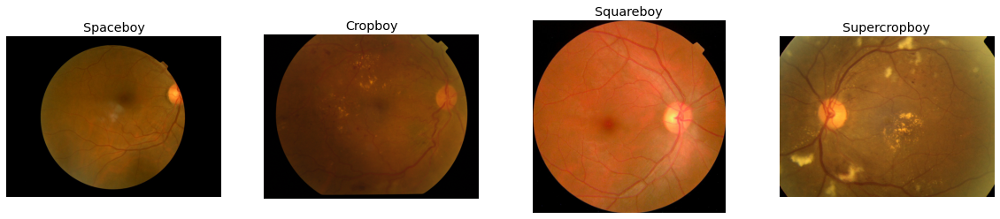

In [22]:
# Observamos las formas de imágenes existentes
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,4))

spaceboy = cv2.imread(f'{TRAIN_PATH}1df0a4c23c95.png')
ax[0].imshow(cv2.cvtColor(spaceboy, cv2.COLOR_BGR2RGB))
ax[0].set_title('Spaceboy')
ax[0].axis('off')

cropboy = cv2.imread(f'{TRAIN_PATH}0a1076183736.png')
ax[1].imshow(cv2.cvtColor(cropboy, cv2.COLOR_BGR2RGB))
ax[1].set_title('Cropboy')
ax[1].axis('off')

squareboy = cv2.imread(f'{TRAIN_PATH}0e3572b5884a.png')
ax[2].imshow(cv2.cvtColor(squareboy, cv2.COLOR_BGR2RGB))
ax[2].set_title('Squareboy')
ax[2].axis('off')

supercropboy = cv2.imread(f'{TRAIN_PATH}698d6e422a80.png')
ax[3].imshow(cv2.cvtColor(supercropboy, cv2.COLOR_BGR2RGB))
ax[3].set_title('Supercropboy')
ax[3].axis('off')

Luego de observar las formas de las imágenes, es necesario realizar un ajuste para cada tipo, con el fin de realizar un recorte desde el centro que permita posicionar las imágenes en un tamaño interno correcto.

Podemos aplicar una función que nos permite realizar un redondeo de la imagen de cada retina para observarlas todas en un mismo tamaño. Este recorte viene desde el centro de la imagen

In [23]:
# Función para definir un corte interno circular en las imágenes
def circle_crop(img, sigmaX=10):   
    """
    Crea un recorte circular alrededor del centro de la imagen   
    """    
    
    img = cv2.imread(img)
    img = crop_image_from_gray(img)    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    height, width, depth = img.shape    
    
    x = int(width/2)
    y = int(height/2)
    r = np.amin((x,y))
    
    circle_img = np.zeros((height, width), np.uint8)
    cv2.circle(circle_img, (x,y), int(r), 1, thickness=-1)
    
    img = cv2.bitwise_and(img, img, mask=circle_img)
    img = crop_image_from_gray(img)
    img=cv2.addWeighted ( img,4, cv2.GaussianBlur( img , (0,0) , sigmaX) ,-4 ,128)
    
    return img 

(-0.5, 480.5, 479.5, -0.5)

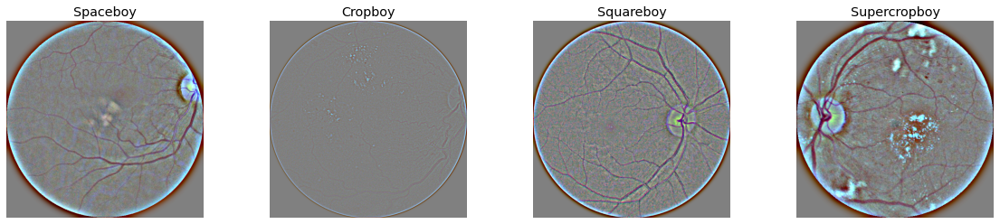

In [24]:
# Observamos las imágenes anteriores después de aplicar el recorte
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,4))

spaceboy = circle_crop(f'{TRAIN_PATH}1df0a4c23c95.png')
ax[0].imshow(cv2.cvtColor(spaceboy, cv2.COLOR_BGR2RGB))
ax[0].set_title('Spaceboy')
ax[0].axis('off')

cropboy = circle_crop(f'{TRAIN_PATH}0a1076183736.png')
ax[1].imshow(cv2.cvtColor(cropboy, cv2.COLOR_BGR2RGB))
ax[1].set_title('Cropboy')
ax[1].axis('off')

squareboy = circle_crop(f'{TRAIN_PATH}0e3572b5884a.png')
ax[2].imshow(cv2.cvtColor(squareboy, cv2.COLOR_BGR2RGB))
ax[2].set_title('Squareboy')
ax[2].axis('off')

supercropboy = circle_crop(f'{TRAIN_PATH}698d6e422a80.png')
ax[3].imshow(cv2.cvtColor(supercropboy, cv2.COLOR_BGR2RGB))
ax[3].set_title('Supercropboy')
ax[3].axis('off')

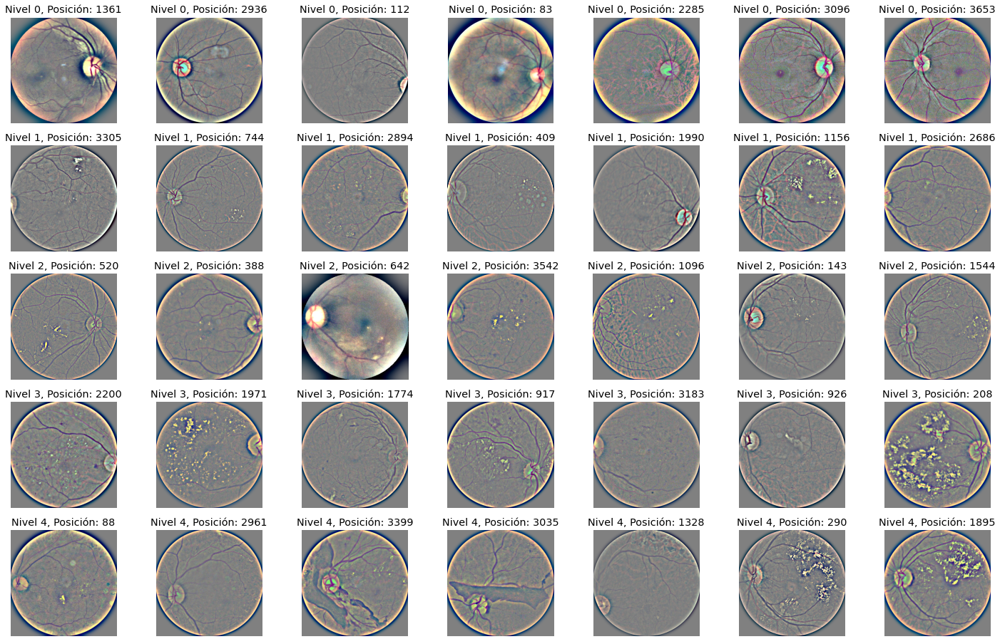

In [25]:
NUM_SAMP=7
fig = plt.figure(figsize=(25, 16))

for class_id in sorted(train_y.unique()):
    
    for i, (posicion, registro) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(NUM_SAMP, random_state=SEED).iterrows()):
        
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        
        path=f"{TRAIN_PATH}{registro['id_code']}.png"
        
        image = circle_crop(path,sigmaX=30)
        
        # Guardamos cada imagen preprocesada para usarlas en el modelo
        pathSave = f"{PREPROC_PATH}{registro['id_code']}.png"
        cv2.imwrite(pathSave, image)
        
        
        plt.imshow(image)
        ax.set_title('Nivel %d, Posición: %d' % (class_id, posicion) )

In [73]:
# Guardamos cada imagen preprocesada para usarlas en el modelo
for class_id in sorted(train_y.unique()):
    
    for i, (posicion, registro) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].iterrows()):
        
        path=f"{TRAIN_PATH}{registro['id_code']}.png"
        
        image = circle_crop(path,sigmaX=30)
    
        pathSave = f"{PREPROC_PATH}{registro['id_code']}.png"
        cv2.imwrite(pathSave, image)

La figura anterior, es el resultado de todo el pre procesamiento de dichas imágenes, de esta forma serán ingresadas a la red neuronal, con el fin de que se aproveche al máximo dicho recurso, a continuación, se muestra un antes y después de las imágenes en su pre procesamiento.

(-0.5, 1375.5, 1378.5, -0.5)

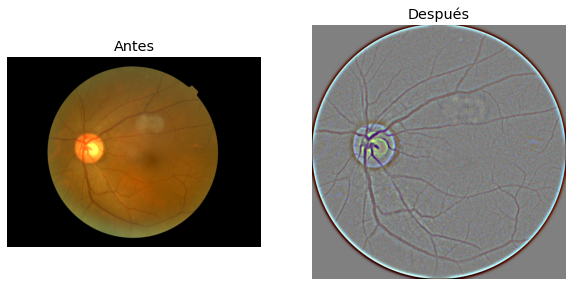

In [26]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,6))

# Imagen antes del preprocesamiento
before = cv2.imread(f'{TRAIN_PATH}cbc23af521f3.png')
ax[0].imshow(cv2.cvtColor(before, cv2.COLOR_BGR2RGB))
ax[0].set_title('Antes')
ax[0].axis('off')

after = circle_crop(f'{TRAIN_PATH}cbc23af521f3.png')
ax[1].imshow(cv2.cvtColor(after, cv2.COLOR_BGR2RGB))
ax[1].set_title('Después')
ax[1].axis('off')

### Formateo de los datos
En esta sección, se busca realizar una transformación al campo id_code, ya que la información de los datos se encuentran en un archivo .csv y las imágenes como tal en otra carpeta, por lo que es importante realizar la adición al nombre de código con .png, para manejar todos los datos desde una misma fuente.

In [3]:
# Volvemos a leer los datos porque ya contiene cambios realizados anteriormente
train_df = pd.read_csv(BASE_PATH + "train.csv")
test_df  = pd.read_csv(BASE_PATH + "test.csv")

# Preprocecss data
train_df["id_code"] = train_df["id_code"].apply(lambda x: x + ".png")
test_df["id_code"] = test_df["id_code"].apply(lambda x: x + ".png")
train_df['diagnosis'] = train_df['diagnosis'].astype('str')

# Observamos el conjunto de datos
train_df.head()

,id_code,diagnosis
0,000c1434d8d7.png,2
1,001639a390f0.png,4
2,0024cdab0c1e.png,1
3,002c21358ce6.png,0
4,005b95c28852.png,0


## FASE 4. MODELADO

Luego de realizar un correcto preprocesamiento en la fase anterior, se procede a realizar la construcción del modelo, con el que se busca dar solución al problema existente.

### Selección del modelo
El desarrollo de este proyecto tiene como objetivo principal desarrollar un sistema que sea capaz de realizar clasificación entre diferentes imágenes oculares, por lo que es pertinente explorar los posibles algoritmos de minería de datos existentes para este tipo de tareas.

Si bien es sabido, para este proyecto se han seleccionados dos modelos, estos se encuentran dentro de los tipos de las redes neuronales convolucionales (CNN).

Es importante resaltar que luego de la implementación de estos modelos, se deben realizar una comparación y observar que modelo en definitiva nos permitirá llevar a cabo de la manera más eficiente el problema.

#### DenseNet
La red convolucional densa (DenseNet) conecta cada capa con todas las demás capas en forma de avance. Mientras que las redes convolucionales tradicionales con capas L tienen conexiones L, una entre cada capa y su capa posterior, nuestra red tiene conexiones directas L(L+1)/2. Para cada capa, los mapas de características de todas las capas anteriores se utilizan como entradas, y sus propios mapas de características se utilizan como entradas en todas las capas posteriores. 

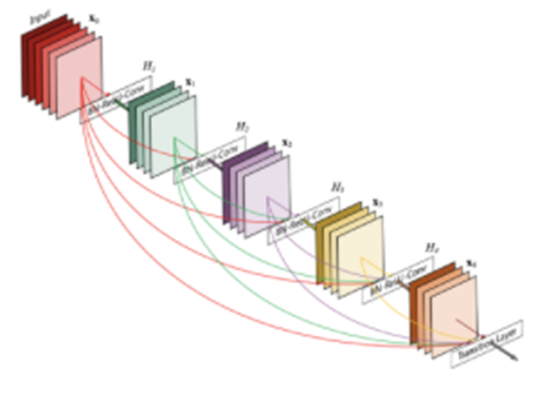

#### Residual Network (ResNet -50)
Una red residual, o ResNet para abreviar, es una red neuronal artificial que ayuda a construir una red neuronal más profunda mediante la utilización de conexiones de salto o accesos directos para saltar sobre algunas capas. Verá cómo la omisión ayuda a crear capas de red más profundas sin caer en el problema de los gradientes que se desvanecen.

Hay diferentes versiones de ResNet, incluidas ResNet-18, ResNet-34, ResNet-50, etc. Los números denotan capas, aunque la arquitectura es la misma.
Hay dos tipos principales de bloques utilizados en ResNet, dependiendo principalmente de si las dimensiones de entrada y salida son iguales o diferentes:
•	Bloque de Identidad: Cuando las dimensiones de activación de entrada y salida son iguales.
•	Bloque de convolución: cuando las dimensiones de activación de entrada y salida son diferentes entre sí.

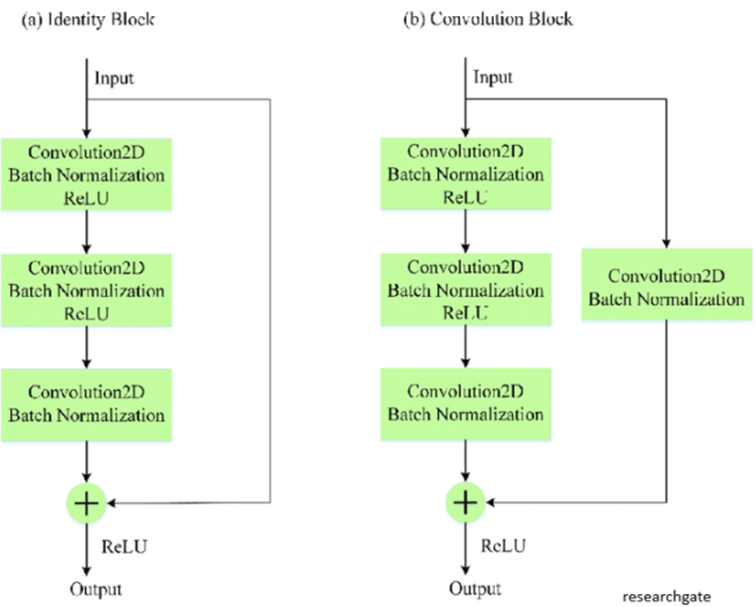
### Generación del plan de prueba

Este ítem consiste dividir el conjunto de datos de entrenamiento, en sub divisiones con el fin de que una vez ejecutado el modelo en su fase de entrenamiento este pueda también ir realizando pruebas internas con un porcentaje de dichos datos.


Para este proyecto, se ha decidido realizar un 80% como datos de pruebas y un 20% como datos de validación o test dentro del entrenamiento.

|  | PORCENTAJE DE DATOS | NÚMERO DE DATOS |
| :-------------: | :-------------: | :-------------: |
| Entrenamiento | 80% | 2930 | 
| Validación | 20% | 732 |

Es importante resaltar que estos datos pueden variar de acuerdo a los resultados obtenidos en el modelo, buscando dar mayor precisión en el modelo empleado.

A continuación se observa la distribución de los datos en código.


In [4]:
# División de los datos de entrenamiento y prueba
from sklearn.model_selection import train_test_split

y = train_df['diagnosis'].values

X_train, X_test, y_train, y_test = train_test_split(train_df, y, test_size=0.20, stratify=y)

In [5]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(2929, 2)
(733, 2)
(2929,)
(733,)


### Construcción del modelo

Para este proyecto se tienen previstos dos modelos, a cada uno de ellos se les hará el respectivo desarrollo.

### Aplicación del modelo DenseNet

Antes de aplicar el modelo es importante realizar un seteo de los parámetros que serán introducidos en el modelo, para este modelo definimos los siguientes:

In [6]:
# Parametros del modelo DenseNet
batch_size = 8
num_classes = 5
l = 14
num_filter = 32
compression = 0.5
dropout_rate = 0

In [7]:
img_height = 32
img_width = 32
channel = 3

Hay que recordar que en DenseNet una salida de la capa anterior actúa como una entrada de la segunda capa mediante el uso de una operación de función compuesta. Esta operación compuesta consta de la capa de convolución (Convolutional), la capa de agrupación (Pooling layer), la normalización por lotes (Batch Normalization) y la capa de activación no lineal (Activation layer).
Por lo que en la tabla, se definen la configuración de dichos parámetros, entre otros que a su vez son de suma importancia.

|  TIPO DE CAPAS | N° DE CAPAS | TAMAÑO DEL KERNEL | PADDING | STRIDE | FUNCIÓN DE ACTIVACIÓN |
| :-------------: | :-------------: | :-------------: | :-------------: | :-------------: | :-------------: |
| Convolutional | 60 | 3 x 3 | same |  | ReLU |
| Batch Normalitazion | 60 | 3 x 3 |  |  |  |
| Activation | 60 |  |  |  |  |
| Concatenate | 56 |  |  |  |  |
| Average Pooling | 4 | 3 x 3 |  | 2 x 2 |  ReLU - Softmax|
| Flatten | 1 |  |  |  |  |


In [8]:
#Building DensetNet Model
tf.keras.backend.clear_session()

# Function Dense Blocks
def denseblock(input, num_filter, dropout_rate):
    global compression
    temp = input
    for _ in range(l): 
        BatchNorm = layers.BatchNormalization()(temp)
        relu = layers.Activation('relu')(BatchNorm)
        Conv2D_3_3 = layers.Conv2D(int(num_filter*compression), (3,3), use_bias=False ,padding='same')(relu)
        if dropout_rate>0:
            Conv2D_3_3 = layers.Dropout(dropout_rate)(Conv2D_3_3)
        concat = layers.Concatenate(axis=-1)([temp,Conv2D_3_3])
        
        temp = concat
        
    return temp

## Function Transition Blocks
def transition(input, num_filter, dropout_rate):
    global compression
    BatchNorm = layers.BatchNormalization()(input)
    relu = layers.Activation('relu')(BatchNorm)
    Conv2D_BottleNeck = layers.Conv2D(int(num_filter*compression), (1,1), use_bias=False ,padding='same')(relu)
    if dropout_rate>0:
         Conv2D_BottleNeck = layers.Dropout(dropout_rate)(Conv2D_BottleNeck)
    avg = layers.AveragePooling2D(pool_size=(2,2))(Conv2D_BottleNeck)
    return avg

# Function Output layer
def output_layer(input):
    global compression
    BatchNorm = layers.BatchNormalization()(input)
    relu = layers.Activation('relu')(BatchNorm)
    AvgPooling = layers.AveragePooling2D(pool_size=(2,2))(relu)
    flat = layers.Flatten()(AvgPooling)
    output = layers.Dense(num_classes, activation='softmax')(flat)
    return output

In [9]:
from tensorflow.keras import layers
from keras.regularizers import l1 ,l2

num_filter = 32
dropout_rate = 0
l = 14

tf.keras.backend.clear_session()

#Almacenamos en la variable input los datos de las imagenes de entrada
input = layers.Input(shape=(img_height, img_width, channel,))

#Dividimos el entrenamiento en cuatro bloques por tratarse de DenseNet
# Primera capa de convolución
First_Conv2D = layers.Conv2D(24, (2,2), use_bias=False ,padding='same', kernel_initializer='he_uniform', bias_initializer='zeros',kernel_regularizer=l2(0.0001))(input)

#Aplicación de la función denseblock en la primera capa
First_Block = denseblock(First_Conv2D, num_filter, dropout_rate)
#Aplicación de la funión transition en la primera capa
First_Transition = transition(First_Block, num_filter, dropout_rate)

#Aplicación del segundo bloque en base al primero
Second_Block = denseblock(First_Transition, num_filter, dropout_rate)
#Transición del segundo bloque
Second_Transition = transition(Second_Block, num_filter, dropout_rate)

#Aplicación del tercer bloque según el segundo
Third_Block = denseblock(Second_Transition, num_filter, dropout_rate)
#Transición del tercer bloque
Third_Transition = transition(Third_Block, num_filter, dropout_rate)

#Aplicación del ultimo bloque según el tercero
Last_Block = denseblock(Third_Transition, num_filter, dropout_rate)
#Salida resultante de toda la primera convolución
output = output_layer(Last_Block)

In [10]:
# Aplicación del modelo con las imagenes de entrada y con las salidas esperadas
model = Model(inputs=[input], outputs=[output])
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 32, 32, 24)   288         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 32, 32, 24)   96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 32, 32, 24)   0           batch_normalization[0][0]        
______________________________________________________________________________________________

A continuación se presenta el resumen del modelo propuesto, una red que cuenta con 60 capas convolucionales y 4 capas de Pooling (sub muestreo). Para cada una de las convoluciones se usó el método Conv2D, un tamaño del kernel de 3x3 y un tipo de borde tipo “same”; es decir, que se agrega un relleno alrededor de cada capa convolucional, haciendo que el tamaño del mapa de características de la salida sea el mismo que el de la entrada. Todas las capas convolucionales fueron seguidas por funciones de activación rectificadoras “ReLU” o “Softmax” y por capas de normalización por Batch. Por otro lado en las capas Pooling se usó el método Average-Pooling2d, con un tamaño de ventana 3x3 y un Stride (paso) de 2x2. Permitiendo esto, que el ancho y alto de la imagen se redujera a la mitad al pasar por cada capa de Pooling. También es importante resaltar que al tratarse de DenseNet se usaron 56 capas de Concatenate con el fin de unir las salidas de las capas y presentarlas a la siguiente. El tamaño de la imagen antes de pasarla por la capa Flatten, era de 7 x 7 pixeles.

El modelo se divido en tres funciones principales, bloque denso (Denseblock), transición (transition) y capa de salida (output layer); se hizo la división en funciones específicas con el fin de trabajar con 4 bloques de entrenamiento de la red.

Se utilizó el método de tasa de aprendizaje adaptativo (Adams), como optimizador durante el entrenamiento y el de categorical_crossentopy como función de costo. El método utilizado para el entrenamiento fue fit_generator.
El tamaño del Batch fue de 8 debido a que experimentalmente fue la cantidad de imágenes que podían ser cagadas en memoria mientras la red se entrenaba. Se utilizó un conjunto de validación de tamaño aprox. del 15% de la cantidad de los datos de entrenamiento (3666). En general, la red tenía 1.031.749 parámetros y su entrenamiento tardo alrededor de 96 horas.


In [11]:
#optimizer = SGD(learning_rate=0.1, momentum=0.9, decay= 1e-6, nesterov=True)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

#### Entrenamiento del modelo DenseNet
Antes de entrenar el modelo se realiza la aplicación de una de las herramientas brindadas por tensorflow como lo es ImageDataGenerator, que permite dividir el conjunto de datos en los de entrenamiento, validación y prueba, y a su vez le aplica unas modificaciones a las imágenes de entrada. 

In [43]:
# reference URL - https://vijayabhaskar96.medium.com/tutorial-on-keras-flow-from-dataframe-1fd4493d237c

datagen=ImageDataGenerator(rescale=1./255, validation_split=0.20, horizontal_flip=True)

#División de los datos de entrenamiento
train_generator=datagen.flow_from_dataframe(dataframe=X_train, directory=TRAIN_PATH, x_col="id_code", y_col="diagnosis", 
                batch_size=8, class_mode="categorical", target_size=(32,32), subset="training")

#División de los de validación
valid_generator=datagen.flow_from_dataframe(dataframe=X_train, directory=TRAIN_PATH, x_col="id_code", y_col="diagnosis", 
                        batch_size=8, class_mode="categorical", target_size=(32,32),  subset="validation")

#División de los datos de prueba
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(dataframe=X_test, directory=TRAIN_PATH, x_col="id_code", 
                y_col=None, batch_size=1, shuffle=False, class_mode=None, target_size=(32,32))

Found 2344 validated image filenames belonging to 5 classes.
Found 585 validated image filenames belonging to 5 classes.
Found 733 validated image filenames.


El entrenamiento de la red se realizó con un total de 50 épocas, la primera vez, puesto que se buscaba economizar el tiempo de ejecución de la red, sin embargo al querer disminuir tiempo, se vieron afectados los resultados de dicha red, reduciendo su precisión y exactitud.

In [44]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=valid_generator.n//valid_generator.batch_size
STEP_SIZE_TEST=test_generator.n//test_generator.batch_size

# Entrenamiento del modelo
model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN, validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID, epochs=50)

Epoch 1/50
293/293 [==============================] - 696s 2s/step - loss: 1.0118 - accuracy: 0.6327 - val_loss: 1.1796 - val_accuracy: 0.5531
Epoch 2/50
293/293 [==============================] - 688s 2s/step - loss: 0.8488 - accuracy: 0.6933 - val_loss: 0.8032 - val_accuracy: 0.7226
Epoch 3/50
293/293 [==============================] - 686s 2s/step - loss: 0.8155 - accuracy: 0.7082 - val_loss: 0.8184 - val_accuracy: 0.7055
Epoch 4/50
293/293 [==============================] - 688s 2s/step - loss: 0.7842 - accuracy: 0.7095 - val_loss: 0.7857 - val_accuracy: 0.7243
Epoch 5/50
293/293 [==============================] - 687s 2s/step - loss: 0.7825 - accuracy: 0.7172 - val_loss: 0.8806 - val_accuracy: 0.6935
Epoch 6/50
293/293 [==============================] - 688s 2s/step - loss: 0.7756 - accuracy: 0.7201 - val_loss: 0.7367 - val_accuracy: 0.7500
Epoch 7/50
293/293 [==============================] - 699s 2s/step - loss: 0.7536 - accuracy: 0.7210 - val_loss: 0.8094 - val_accuracy: 0.7312

En los resultados se observa como el porcentaje de exactitud estuvo siempre alrededor de un 60% y 70%, lo que no brinda la confiabilidad suficiente para resultados del modelo.

In [45]:
y_pred = model.predict(test_generator)
y_pred_class = np.argmax(y_pred, axis=1)

In [47]:
from sklearn.metrics import cohen_kappa_score
cohen = cohen_kappa_score(y_pred_class, y_test.astype('int'), weights='quadratic')
print("Quadratic Cohen kappa score of VGG model on test data is - %.3f" %cohen)

Quadratic Cohen kappa score of VGG model on test data is - 0.696


A continuación se presenta el primer reporte de clasificación para la primera parte del modelo.

Classification Report : 
               precision    recall  f1-score   support

           0       0.92      0.92      0.92       361
           1       0.47      0.46      0.46        74
           2       0.57      0.59      0.58       200
           3       0.25      0.21      0.23        39
           4       0.23      0.24      0.24        59

    accuracy                           0.69       733
   macro avg       0.49      0.48      0.49       733
weighted avg       0.69      0.69      0.69       733



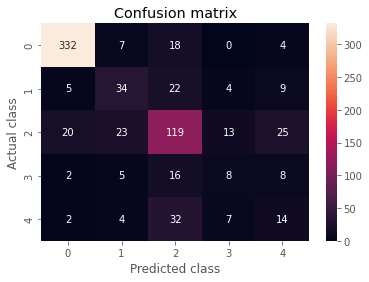

In [49]:
from sklearn.metrics import confusion_matrix, classification_report

print ('Classification Report : \n', classification_report(y_test.astype('int'), y_pred_class))
sns.heatmap(confusion_matrix(y_test.astype('int'), y_pred_class), annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('Actual class')
plt.xlabel('Predicted class')
plt.show()

En la figura anterior, se ve como el modelo DenseNet presenta una exactitud del 69% lo cual no está mal, pero no es la óptima para brindar resultados precisión en diagnósticos de retinopatía como lo necesitados. Si bien el que mejor precisión mostro fue para imágenes de los pacientes que no presentan retinopatía diabética.

En la matriz de confusión se puede notar la alta disrupción en la clasificación de los datos, la mayoría son falsos negativos y esto no son buenos resultados, en los pacientes con enfermedad en grado 2, la variación es altísima por lo que brindar un diagnostico con un modelo que presente estos resultados no es adecuado.

Luego de analizar los resultados presentados anteriormente, se deseó realizar una nueva aplicación de este mismo modelo, almacenando los datos pre procesados en una carpeta distinta y realizar el envió de estos de forma directa a lo cual se presentaron los resultados a continuación.


Después de observar los resultados del modelo, se quisó realizar una prueba con las imagenes preprocesadas que se almacenaron en una carpeta distinta para observar como era los resultados con dicha variación

#### APLICACIÓN DEL MODELO DENSE NET CON LOS DATOS PREPROCESADOS

In [12]:
#VOLVEMOS A HACER LA PREUBA PERO CON LOS DATOS PREPROCESADOS
# reference URL - https://vijayabhaskar96.medium.com/tutorial-on-keras-flow-from-dataframe-1fd4493d237c

datagenerator=ImageDataGenerator(rescale=1./255, validation_split=0.20, horizontal_flip=True)

train_gen=datagenerator.flow_from_dataframe(dataframe=X_train, directory=PREPROC_PATH, x_col="id_code", y_col="diagnosis", 
                batch_size=8, class_mode="categorical", target_size=(32,32), subset="training")

valid_gen=datagenerator.flow_from_dataframe(dataframe=X_train, directory=PREPROC_PATH, x_col="id_code", y_col="diagnosis", 
                        batch_size=8, class_mode="categorical", target_size=(32,32),  subset="validation")

test_datagenerator=ImageDataGenerator(rescale=1./255.)

test_gen=test_datagenerator.flow_from_dataframe(dataframe=X_test, directory=PREPROC_PATH, x_col="id_code", 
                y_col=None, batch_size=1, shuffle=False, class_mode=None, target_size=(32,32))

Found 2344 validated image filenames belonging to 5 classes.
Found 585 validated image filenames belonging to 5 classes.
Found 733 validated image filenames.


In [14]:
STEP_TRAIN=train_gen.n//train_gen.batch_size
STEP_VALID=valid_gen.n//valid_gen.batch_size
STEP_TEST=test_gen.n//test_gen.batch_size
model.fit_generator(generator=train_gen, steps_per_epoch=STEP_TRAIN, validation_data=valid_gen,
                    validation_steps=STEP_VALID, epochs=50)

Epoch 1/50
293/293 [==============================] - 558s 2s/step - loss: 1.0130 - accuracy: 0.6472 - val_loss: 1.3181 - val_accuracy: 0.5565
Epoch 2/50
293/293 [==============================] - 537s 2s/step - loss: 0.8642 - accuracy: 0.6881 - val_loss: 0.9736 - val_accuracy: 0.6747
Epoch 3/50
293/293 [==============================] - 530s 2s/step - loss: 0.8235 - accuracy: 0.6997 - val_loss: 0.8922 - val_accuracy: 0.6815
Epoch 4/50
293/293 [==============================] - 530s 2s/step - loss: 0.7772 - accuracy: 0.7163 - val_loss: 0.8668 - val_accuracy: 0.6952
Epoch 5/50
293/293 [==============================] - 532s 2s/step - loss: 0.7338 - accuracy: 0.7278 - val_loss: 0.9217 - val_accuracy: 0.6798
Epoch 6/50
293/293 [==============================] - 533s 2s/step - loss: 0.7339 - accuracy: 0.7325 - val_loss: 0.9310 - val_accuracy: 0.6490
Epoch 7/50
293/293 [==============================] - 532s 2s/step - loss: 0.6863 - accuracy: 0.7376 - val_loss: 0.8492 - val_accuracy: 0.6884

In [15]:
y_pre = model.predict(test_gen)
y_pred_c = np.argmax(y_pre, axis=1)

In [16]:
from sklearn.metrics import cohen_kappa_score
coh = cohen_kappa_score(y_pred_c, y_test.astype('int'), weights='quadratic')
print("Quadratic Cohen kappa score of VGG model on test data is - %.3f" %coh)

Quadratic Cohen kappa score of VGG model on test data is - 0.679


Classification Report : 
               precision    recall  f1-score   support

           0       0.90      0.96      0.93       361
           1       0.47      0.22      0.30        74
           2       0.58      0.64      0.61       200
           3       0.29      0.13      0.18        39
           4       0.22      0.27      0.24        59

    accuracy                           0.70       733
   macro avg       0.49      0.44      0.45       733
weighted avg       0.68      0.70      0.68       733



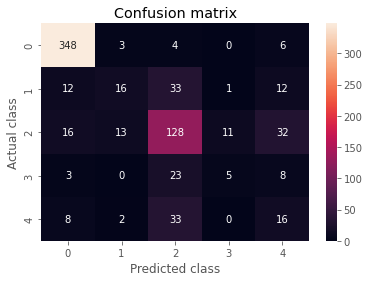

In [17]:
from sklearn.metrics import confusion_matrix, classification_report

print ('Classification Report : \n', classification_report(y_test.astype('int'), y_pred_c))
sns.heatmap(confusion_matrix(y_test.astype('int'), y_pred_c), annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('Actual class')
plt.xlabel('Predicted class')
plt.show()

Si bien, los resultados obtenidos anteriormente no presentan una variación grande, se puede decir que es prácticamente lo mismo, lo que nos da a entender que este modelo o la aplicación de esta red neuronal convolucional para este proyecto no funcionarán de la mejor manera, por lo que es necesario seguir explorando en los otros modelos propuestos.

A su vez, para realizar una determinación precisa, se aplica el coeficiente de Cohen Kappa y se obtiene un resultado del 68%, lo que dice que el nivel de grado de acuerdo puede ser bueno, pero siempre es necesario uno mejor.


In [39]:
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator_2019=test_datagen.flow_from_dataframe(dataframe=test_df, directory=TEST_PATH, x_col="id_code", 
                y_col=None, batch_size=1, shuffle=False, class_mode=None, target_size=(32,32))

Found 1928 validated image filenames.


In [40]:
y_pred_2019 = model.predict(test_generator_2019)
y_pred_class_2019 = np.argmax(y_pred_2019, axis=1)

In [41]:
filenames = list()
for i in test_generator_2019.filenames:
    temp = i.split('.')[-2]
    temp = temp.split('/')[-1]
    filenames.append(temp)

In [42]:
submission_dense = pd.DataFrame()
submission_dense['id_code'] = filenames
submission_dense['diagnosis'] = y_pred_class_2019

In [43]:
submission_dense

,id_code,diagnosis
0,0005cfc8afb6,1
1,003f0afdcd15,1
2,006efc72b638,1
3,00836aaacf06,1
4,009245722fa4,1
...,...,...
1923,ff2fd94448de,2
1924,ff4c945d9b17,2
1925,ff64897ac0d8,1
1926,ffa73465b705,1


In [44]:
testeo =ImageDataGenerator(rescale=1./255.)

test_generator_2020=testeo.flow_from_dataframe(dataframe=train_df, directory=TRAIN_PATH, x_col="id_code", 
                y_col=None, batch_size=1, shuffle=False, class_mode=None, target_size=(32,32))

Found 3662 validated image filenames.


In [45]:
y_pred_2020 = model.predict(test_generator_2020)
y_pred_class_2020 = np.argmax(y_pred_2020, axis=1)

In [47]:
filenames = list()
for i in test_generator_2020.filenames:
    temp = i.split('.')[-2]
    temp = temp.split('/')[-1]
    filenames.append(temp)

In [48]:
submission_d = pd.DataFrame()
submission_d['id_code'] = filenames
submission_d['diagnosis'] = y_pred_class_2020

In [49]:
submission_d

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,1
2,0024cdab0c1e,1
3,002c21358ce6,1
4,005b95c28852,1
...,...,...
3657,ffa47f6a7bf4,2
3658,ffc04fed30e6,0
3659,ffcf7b45f213,1
3660,ffd97f8cd5aa,1


## APLICACIÓN DEL CNN RESNET50

In [2]:
#Leemos nuevamente los datos para no confundir los anteriores
train = pd.read_csv(f'{BASE_PATH}train.csv')
test = pd.read_csv(f'{BASE_PATH}test.csv')

Como en la red convolucional DenseNet, para este modelo también es necesario definir o inicializar unos parámetros pertinentes para el entrenamiento del modelo, en la figura se presentan.

In [3]:
# Model parameters
BATCH_SIZE = 8 #Número de imágenes por batch
EPOCHS = 20    #Número de épocas
WARMUP_EPOCHS = 2 #Número de epocas para el pre-entrenamiento
LEARNING_RATE = 1e-4 #Rata de aprendizaje
WARMUP_LEARNING_RATE = 1e-3 #Rata de aprendizaje para el pre-entrenamiento
HEIGHT = 512 #Altura de la imagen
WIDTH = 512 #Ancho de la imagen
CANAL = 3 #Numero de canal para las imagenes
N_CLASSES = train['diagnosis'].nunique() #Numero de clases 5
ES_PATIENCE = 5 
RLROP_PATIENCE = 3
DECAY_DROP = 0.5

In [4]:
# Preprocecss data
train["id_code"] = train["id_code"].apply(lambda x: x + ".png")
test["id_code"] = test["id_code"].apply(lambda x: x + ".png")
train['diagnosis'] = train['diagnosis'].astype('str')
train.head()

,id_code,diagnosis
0,000c1434d8d7.png,2
1,001639a390f0.png,4
2,0024cdab0c1e.png,1
3,002c21358ce6.png,0
4,005b95c28852.png,0


In [5]:
train_datagen=ImageDataGenerator(rescale=1./255, 
                                 validation_split=0.2,
                                 horizontal_flip=True)

train_generator=train_datagen.flow_from_dataframe(
    dataframe=train,
    directory=TRAIN_PATH,
    x_col="id_code",
    y_col="diagnosis",
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    target_size=(HEIGHT, WIDTH),
    subset='training')

valid_generator=train_datagen.flow_from_dataframe(
    dataframe=train,
    directory=TRAIN_PATH,
    x_col="id_code",
    y_col="diagnosis",
    batch_size=BATCH_SIZE,
    class_mode="categorical",    
    target_size=(HEIGHT, WIDTH),
    subset='validation')

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(  
        dataframe=test,
        directory =TEST_PATH,
        x_col="id_code",
        target_size=(HEIGHT, WIDTH),
        batch_size=1,
        shuffle=False,
        class_mode=None)

Found 2930 validated image filenames belonging to 5 classes.
Found 732 validated image filenames belonging to 5 classes.
Found 1928 validated image filenames.


Definimos la función general para crear el modelo

In [6]:
def create_model(input_shape, n_out):
    input_tensor = Input(shape=input_shape)
    base_model = tf.keras.applications.ResNet50(weights='imagenet', 
                                       include_top=False,
                                       input_tensor=input_tensor)
    #base_model.load_weights('../input/resnet50/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5')

    x = GlobalAveragePooling2D()(base_model.output)
    x = Dropout(0.5)(x)
    x = Dense(2048, activation='relu')(x)
    x = Dropout(0.5)(x)
    final_output = Dense(n_out, activation='softmax', name='final_output')(x)
    model = Model(input_tensor, final_output)
    
    return model

In [7]:
model = create_model(input_shape=(HEIGHT, WIDTH, CANAL), n_out=N_CLASSES)

for layer in model.layers:
    layer.trainable = False

for i in range(-5, 0):
    model.layers[i].trainable = True

metric_list = ["accuracy"]
optimizer = tf.keras.optimizers.Adam(lr=WARMUP_LEARNING_RATE)
model.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 518, 518, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 256, 256, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 256, 256, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

conv5_block1_0_bn (BatchNormali (None, 16, 16, 2048) 8192        conv5_block1_0_conv[0][0]        
__________________________________________________________________________________________________
conv5_block1_3_bn (BatchNormali (None, 16, 16, 2048) 8192        conv5_block1_3_conv[0][0]        
__________________________________________________________________________________________________
conv5_block1_add (Add)          (None, 16, 16, 2048) 0           conv5_block1_0_bn[0][0]          
                                                                 conv5_block1_3_bn[0][0]          
__________________________________________________________________________________________________
conv5_block1_out (Activation)   (None, 16, 16, 2048) 0           conv5_block1_add[0][0]           
__________________________________________________________________________________________________
conv5_block2_1_conv (Conv2D)    (None, 16, 16, 512)  1049088     conv5_block1_out[0][0]           
__________

En esta red, se realizaron dos entrenamientos, primero fue un pre – entrenamiento, que busco dar ajustes al modelo, para obtener mejores resultados en el desarrollo de este.

En el resultado anterior se presenta la configuración del modelo en el pre – entrenamiento, en donde se aplicaron los mismos parámetros que la red anterior, presentados en la tabla 4, con la diferencia que en vez de Average Pooling, se usó Max Pooling, en este caso el modelo como resultado de sus parámetros obtuvo un total de 27.794.309 y el pre – entrenamiento duro alrededor de 20 minutos


In [8]:
STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size

history_warmup = model.fit_generator(generator=train_generator,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=valid_generator,
                                     validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

Epoch 1/2
366/366 [==============================] - 3305s 9s/step - loss: 2.3251 - accuracy: 0.3943 - val_loss: 1.3448 - val_accuracy: 0.4588
Epoch 2/2
366/366 [==============================] - 2323s 6s/step - loss: 1.3702 - accuracy: 0.4709 - val_loss: 1.3456 - val_accuracy: 0.4588


Para el entrenamiento principal, se usaron dos métricas de entrenamiento que permite la evolución del modelo a medida que van transcendiendo las capas de la red, en este caso se usaron herramientas de keras, como lo son Parada temprana (EarlyStopping) y ReduceLROnPlateau, siendo la primera una métrica que permite detener el proceso de ejecución de entreno de la red cuando cualquier métrica dentro del modelo haya dejado de mejorar, y en general fue usada para minimizar la perdida. Posteriormente la segunda se encarga de reducir la rata de aprendizaje cuando una métrica haya dejado de mejorar, los modelos a menudo se benefician al reducir la tasa de aprendizaje en un factor de 2 a 10 una vez que el aprendizaje se estanca. Esta devolución de llamada supervisa una cantidad y, si no se observa ninguna mejora durante un número de épocas de "paciencia", la tasa de aprendizaje se reduce.

In [9]:
for layer in model.layers:
    layer.trainable = True

es = EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop = ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es, rlrop]
optimizer = tf.keras.optimizers.Adam(lr=LEARNING_RATE)
model.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 518, 518, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 256, 256, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 256, 256, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

In [10]:
history_finetunning = model.fit_generator(generator=train_generator,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=valid_generator,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

Epoch 1/20
366/366 [==============================] - 16245s 44s/step - loss: 0.7851 - accuracy: 0.7248 - val_loss: 3.8415 - val_accuracy: 0.4574
Epoch 2/20
366/366 [==============================] - 16263s 44s/step - loss: 0.6022 - accuracy: 0.7786 - val_loss: 1.3464 - val_accuracy: 0.4973
Epoch 3/20
366/366 [==============================] - 16994s 46s/step - loss: 0.5157 - accuracy: 0.8107 - val_loss: 0.7090 - val_accuracy: 0.7857
Epoch 4/20
366/366 [==============================] - 17067s 47s/step - loss: 0.4604 - accuracy: 0.8282 - val_loss: 0.6514 - val_accuracy: 0.7857
Epoch 5/20
366/366 [==============================] - 17788s 49s/step - loss: 0.4264 - accuracy: 0.8446 - val_loss: 0.6304 - val_accuracy: 0.7527
Epoch 6/20
366/366 [==============================] - 17287s 47s/step - loss: 0.4109 - accuracy: 0.8467 - val_loss: 0.5592 - val_accuracy: 0.7830
Epoch 7/20
366/366 [==============================] - 17278s 47s/step - loss: 0.3650 - accuracy: 0.8607 - val_loss: 0.6931 -

Analizando los resultados del entrenamiento del modelo anterior, se puede observar que aunque se aplicó un total de 20 épocas, en la numero 9 de hace una reducción de la tasa de aprendizaje, lo que es un buen signo porque al ser una tasa de aprendizaje mucho menor el modelo de entrenamiento puede brindar resultados muchos más óptimos. 

De igual forma durante todo el entrenamiento la exactitud del modelo fue en aumento todo el tiempo, y de igual forma en la época 13 la tasa de aprendizaje siguió disminuyendo, por último en la época 15 el modelo aplico una parada temprana (Early Stopping), esto porque el modelo alcanzo un número menor de la rata de aprendizaje requerida, que para este modelo era de 0,0001, alcanzando en este punto una exactitud del 97,8%, siendo un resultado completamente óptimo para el modelo. 

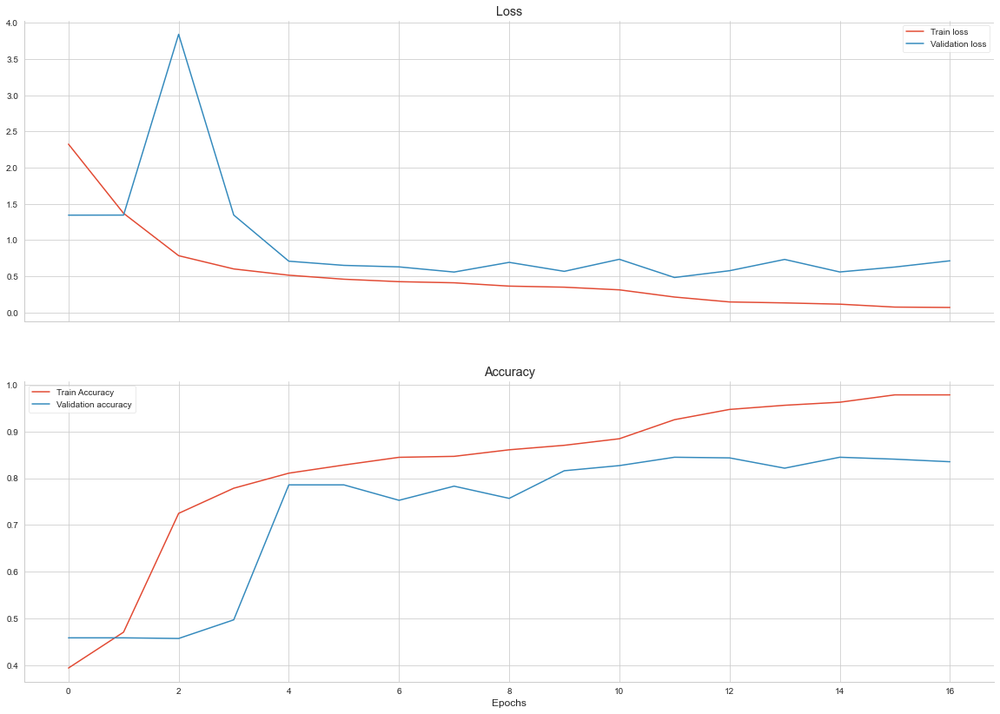

In [11]:
history = {'loss': history_warmup['loss'] + history_finetunning['loss'], 
           'val_loss': history_warmup['val_loss'] + history_finetunning['val_loss'], 
           'accuracy': history_warmup['accuracy'] + history_finetunning['accuracy'], 
           'val_accuracy': history_warmup['val_accuracy'] + history_finetunning['val_accuracy']}

sns.set_style("whitegrid")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 14))

ax1.plot(history['loss'], label='Train loss')
ax1.plot(history['val_loss'], label='Validation loss')
ax1.legend(loc='best')
ax1.set_title('Loss')

ax2.plot(history['accuracy'], label='Train Accuracy')
ax2.plot(history['val_accuracy'], label='Validation accuracy')
ax2.legend(loc='best')
ax2.set_title('Accuracy')

plt.xlabel('Epochs')
sns.despine()
plt.show()

En la primera grafica **Iteraciones vs error máximo permitido** se puede analizar que a medida que aumentan el número de iteraciones el error máximo permitido disminuye y para este caso en la iteración número 15, se detiene. Cabe resaltar que se usó una rata de aprendizaje de 0,0001 y un error máximo permitido de 0.5, sin embargo en la iteración número 9 este valor fue obtenido pero el entrenamiento consiguió su ejecución hasta conseguir un número mucho más bajo. 

Para la segunda **Iteraciones vs exactitud** se observa como la exactitud va en aumento a medida que las iteraciones transcurren, siendo esto un buen signo, ya que entre mayor número de iteraciones mayor debe ser la exactitud del modelo para obtener un resultado bueno, en este caso se logró una exactitud del 98%, lo que deja ver que nuestro modelo está en buen funcionamiento.

In [12]:
model.save("modelo.h5")

In [13]:
complete_datagen = ImageDataGenerator(rescale=1./255)
complete_generator = complete_datagen.flow_from_dataframe(  
        dataframe=train,
        directory = TRAIN_PATH,
        x_col="id_code",
        target_size=(HEIGHT, WIDTH),
        batch_size=1,
        shuffle=False,
        class_mode=None)

STEP_SIZE_COMPLETE = complete_generator.n//complete_generator.batch_size
train_preds = model.predict_generator(complete_generator, steps=STEP_SIZE_COMPLETE)
train_preds = [np.argmax(pred) for pred in train_preds]

Found 3662 validated image filenames.


En el mismo sentido que el modelo DenseNet, para este tipo de red se aplican las mismas métricas que permiten calificar el resultado del modelo.

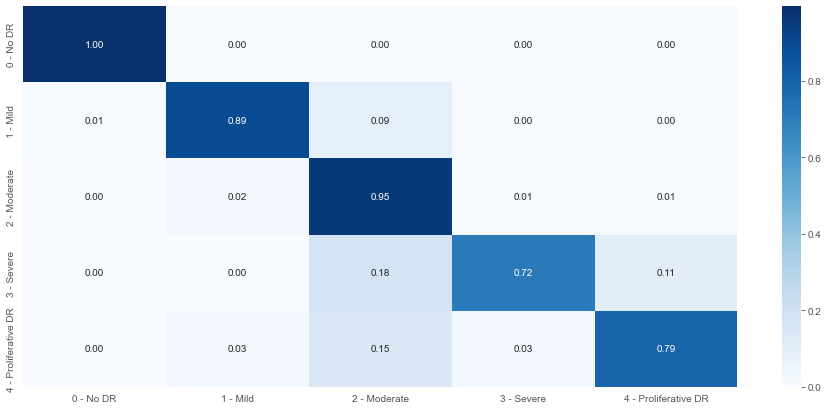

In [17]:
labels = ['0 - No DR', '1 - Mild', '2 - Moderate', '3 - Severe', '4 - Proliferative DR']
cnf_matrix = confusion_matrix(train['diagnosis'].astype('int'), train_preds)
cnf_matrix_norm = cnf_matrix.astype('float') / cnf_matrix.sum(axis=1)[:, np.newaxis]
df_cm = pd.DataFrame(cnf_matrix_norm, index=labels, columns=labels)
plt.figure(figsize=(16, 7))
sns.heatmap(df_cm, annot=True, fmt='.2f', cmap="Blues")
plt.show()

La figura anterior presenta la matriz de confusión resultante y se puede identificar como los resultados son buenos en este tipo de datos, para este caro a los pacientes con No DR los predice en un 100%, para los que presentan Mild en un 89%, para los Moderate en un 95%, para los Severe en un 72% y para los Proliferative DR un 79%, lo cual es completamente bueno.

In [18]:
print(classification_report(train['diagnosis'].astype('int'), train_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1805
           1       0.90      0.89      0.90       370
           2       0.89      0.95      0.92       999
           3       0.87      0.72      0.78       193
           4       0.88      0.79      0.83       295

    accuracy                           0.94      3662
   macro avg       0.91      0.87      0.89      3662
weighted avg       0.94      0.94      0.94      3662



El resultado anterior presenta el reporte de clasificación para el modelo ResNet – 50 y se puede ver como la exactitud da un total de 94% para todos los datos presentados, a su vez el rango de precisión para todos los tipos de imágenes presentados es de un 87% al 100%, lo que es muy bueno para diagnósticos médicos.

De igual forma, se realizó la aplicación del test de coeficiente de Cohen Kappa y los resultados fueron un 96% de concordancia lo que se encuentra dentro del mayor grado de confiabilidad.

In [19]:
print("Train Cohen Kappa score: %.3f" % cohen_kappa_score(train_preds, train['diagnosis'].astype('int'), weights='quadratic'))

Train Cohen Kappa score: 0.961


In [20]:
#Apply model to test set and output predictions
test_generator.reset()
STEP_SIZE_TEST = test_generator.n//test_generator.batch_size
preds = model.predict_generator(test_generator, steps=STEP_SIZE_TEST,verbose =1)
predictions = [np.argmax(pred) for pred in preds]

1928/1928 [==============================] - 1452s 753ms/step


In [21]:
filenames = test_generator.filenames
results = pd.DataFrame({'id_code':filenames, 'diagnosis':predictions})
results['id_code'] = results['id_code'].map(lambda x: str(x)[:-4])
results.to_csv('submission.csv',index=False)
results.head(10)

,id_code,diagnosis
0,0005cfc8afb6,2
1,003f0afdcd15,2
2,006efc72b638,2
3,00836aaacf06,2
4,009245722fa4,2
5,009c019a7309,2
6,010d915e229a,3
7,0111b949947e,1
8,01499815e469,2
9,0167076e7089,2


Para finalizar la etapa de evaluación del modelo, se realizó la aplicación del modelo al 20% de los datos de prueba que se habían dividido al principio del preprocesamiento de los datos y se obtuvo el siguiente resultado.

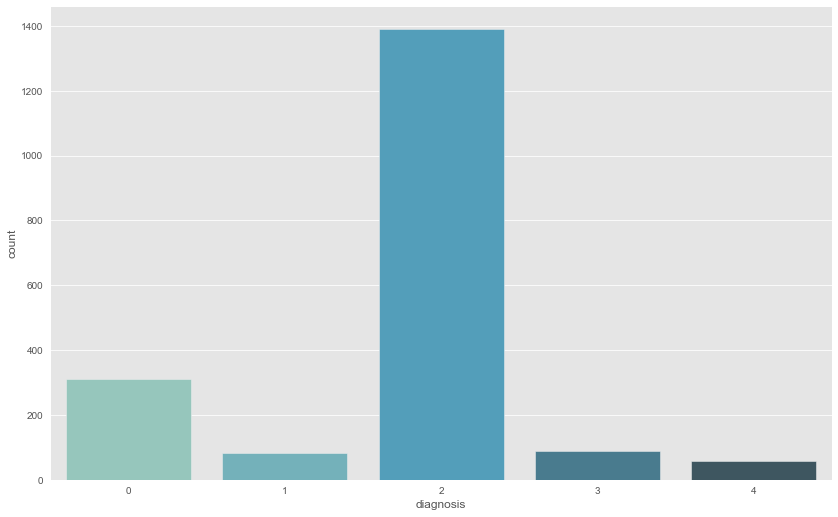

In [22]:
# Predictions class distribution
f, ax = plt.subplots(figsize=(14, 8.7))
ax = sns.countplot(x="diagnosis", data=results, palette="GnBu_d")
sns.despine()
plt.show()